# **Challenge Chapter 2 : Customer Churn Classification Problem**
### Tim Penyusun : Kelompok P 
1. Ilham Ramadan Mu'taz
2. Imam Ahmad Qusyairi

### Objectives 
1. Menyiapkan & Membersihkan Data 
2. Melakukan Eskplorasi Data
3. Membangun Model Dengan Performa Terbaik


In [ ]:
!pip install optuna 
!pip install xgboost
!pip install lightgbm
!pip install imblearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.3/365.3 KB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 KB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 KB 7.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# 1. Import Modules & Data

In [ ]:
import pandas as pd
import numpy as np
from numpy import percentile, mean

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, make_scorer, recall_score, roc_curve, roc_auc_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score

import optuna
import xgboost as xgb
import lightgbm as lgb
from imblearn.over_sampling import SMOTE

import warnings
import io

%matplotlib inline
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')

In [ ]:
from google.colab import files
df_train = files.upload()
df_test = files.upload()

Saving Data Train.csv to Data Train.csv


Saving Data Test.csv to Data Test.csv


In [ ]:
df_train

{'Data Train.csv': b'state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn\nOH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,no\nNJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,no\nOH,84,area_code_408,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no\nOK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no\nMA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no\nMO,147,area_code_415,yes,no,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,no\nLA,117,area_code_408,no,no,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,n

In [ ]:
df_test

{'Data Test.csv': b'id,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls\n1,KS,128,area_code_415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.7,1\n2,AL,118,area_code_510,yes,no,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.7,0\n3,IA,62,area_code_415,no,no,0,120.7,70,20.52,307.2,76,26.11,203.0,99,9.14,13.1,6,3.54,4\n4,VT,93,area_code_510,no,no,0,190.7,114,32.42,218.2,111,18.55,129.6,121,5.83,8.1,3,2.19,3\n5,NE,174,area_code_415,no,no,0,124.3,76,21.13,277.1,112,23.55,250.7,115,11.28,15.5,5,4.19,3\n6,IL,142,area_code_415,no,no,0,84.8,95,14.42,136.7,63,11.62,250.5,148,11.27,14.2,6,3.83,2\n7,LA,172,area_code_408,no,no,0,212.0,121,36.04,31.2,115,2.65,293.3,78,13.2,12.6,10,3.4,3\n8,GA,72

In [ ]:
train = pd.read_csv(r'/content/Data Train.csv')
test = pd.read_csv(r'/content/Data Test.csv')

# 2. Exploratory Data Analysis (EDA)

In [ ]:
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [ ]:
train.shape

(4250, 20)

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [ ]:
train.isna().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

In [ ]:
# info fitur statistic
train.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000
mean,100.236235,7.631765,180.259600,99.907294,30.644682,200.173906,100.176471,17.015012,200.527882,99.839529,9.023892,10.256071,4.426353,2.769654,1.559059
std,39.698401,13.439882,54.012373,19.850817,9.182096,50.249518,19.908591,4.271212,50.353548,20.093220,2.265922,2.760102,2.463069,0.745204,1.311434
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.325000,87.000000,24.365000,165.925000,87.000000,14.102500,167.225000,86.000000,7.522500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,180.450000,100.000000,30.680000,200.700000,100.000000,17.060000,200.450000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,16.000000,216.200000,113.000000,36.750000,233.775000,114.000000,19.867500,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.000000,52.000000,351.500000,165.000000,59.760000,359.300000,170.000000,30.540000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [ ]:
#korelasi antara fitur
train.corr()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
account_length,1.000000,-0.006626,-0.001612,0.023002,-0.001613,-0.010326,0.005535,-0.010322,-0.009916,-0.001846,-0.009942,0.004539,0.013690,0.004494,0.001002
number_vmail_messages,-0.006626,1.000000,0.002000,-0.006920,0.001994,0.010725,0.003593,0.010736,0.018308,0.001977,0.018300,0.005220,0.006585,0.005249,-0.015303
total_day_minutes,-0.001612,0.002000,1.000000,0.000747,1.000000,-0.013248,0.005986,-0.013258,0.010049,-0.004812,0.010036,-0.021369,0.003859,-0.021291,-0.002925
total_day_calls,0.023002,-0.006920,0.000747,1.000000,0.000751,0.008661,0.003739,0.008663,0.002206,-0.004815,0.002200,0.008834,0.009377,0.008909,-0.015845
total_day_charge,-0.001613,0.001994,1.000000,0.000751,1.000000,-0.013247,0.005985,-0.013257,0.010053,-0.004816,0.010040,-0.021374,0.003853,-0.021296,-0.002932
total_eve_minutes,-0.010326,0.010725,-0.013248,0.008661,-0.013247,1.000000,0.003101,1.000000,-0.014018,0.011973,-0.014031,-0.003509,0.012239,-0.003460,-0.010063
total_eve_calls,0.005535,0.003593,0.005986,0.003739,0.005985,0.003101,1.000000,0.003120,0.008425,-0.011929,0.008441,-0.013096,0.004949,-0.013145,0.006956
total_eve_charge,-0.010322,0.010736,-0.013258,0.008663,-0.013257,1.000000,0.003120,1.000000,-0.014022,0.011971,-0.014035,-0.003512,0.012239,-0.003463,-0.010071
total_night_minutes,-0.009916,0.018308,0.010049,0.002206,0.010053,-0.014018,0.008425,-0.014022,1.000000,0.023815,0.999999,-0.000113,-0.024280,-0.000047,-0.013771
total_night_calls,-0.001846,0.001977,-0.004812,-0.004815,-0.004816,0.011973,-0.011929,0.011971,0.023815,1.000000,0.023798,0.001093,0.003851,0.001054,-0.008893


<Axes: >

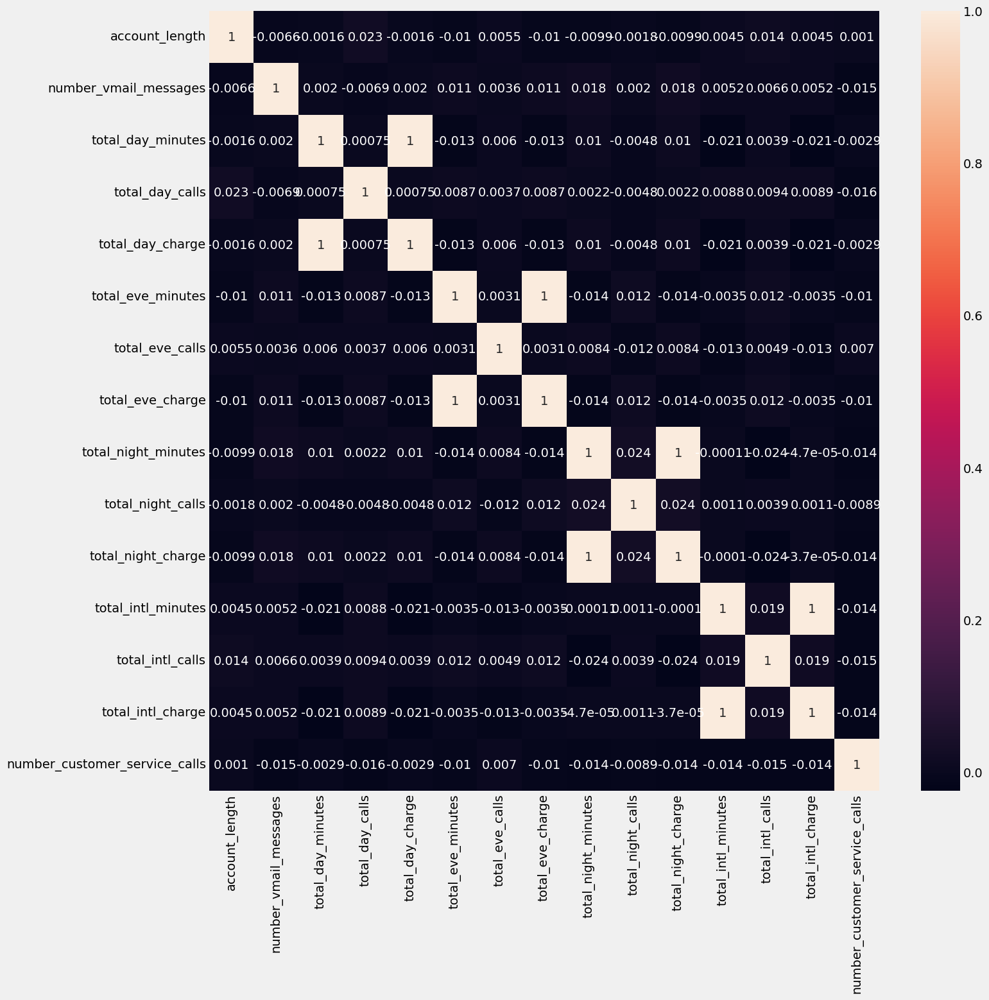

In [ ]:
# penampilan korelasi antar kolom dengan heatmap
plt.figure(figsize=(15,15))
sns.heatmap(train.corr(), annot=True)

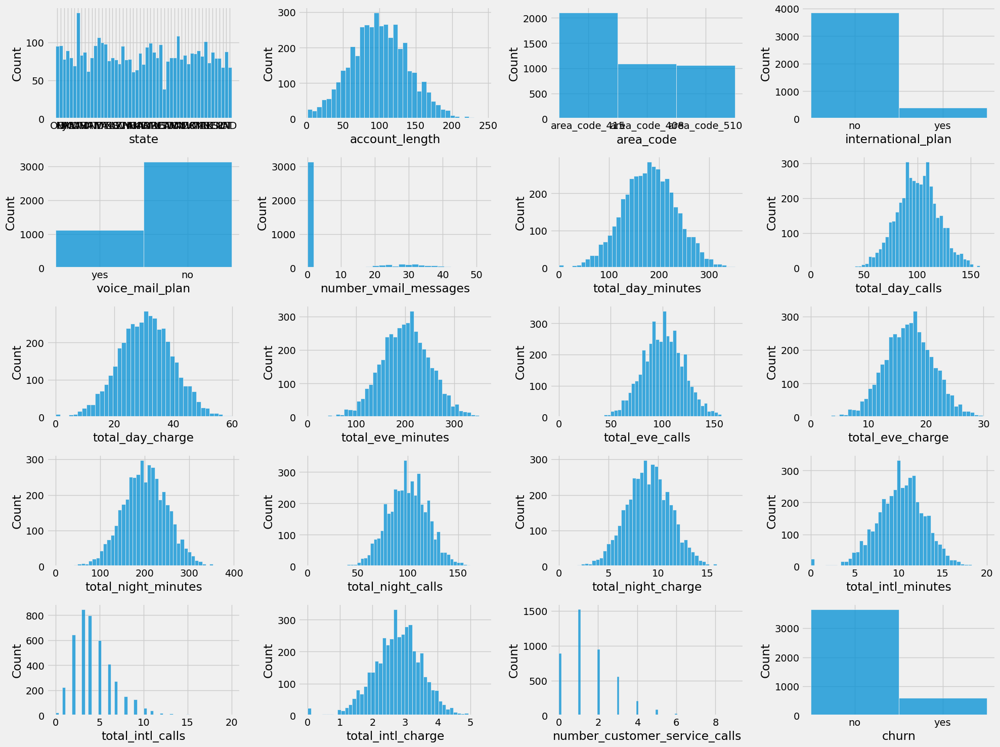

In [ ]:
num_rows = (len(train.columns)+2)//4
fig, axes = plt.subplots(nrows=num_rows, ncols=4, figsize=(20,15))

for i, col in enumerate(train.columns):
  sns.histplot(data=train, x=col, ax=axes[i//4, i%4])
plt.tight_layout()
plt.show()

In [ ]:
train.state.unique()

array(['OH', 'NJ', 'OK', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI', 'IA', 'MT',
       'NY', 'ID', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC', 'WY', 'HI', 'NH',
       'AK', 'GA', 'MD', 'AR', 'WI', 'OR', 'MI', 'DE', 'UT', 'CA', 'SD',
       'NC', 'WA', 'MN', 'NM', 'NV', 'DC', 'VT', 'KY', 'ME', 'MS', 'AL',
       'NE', 'KS', 'TN', 'IL', 'PA', 'CT', 'ND'], dtype=object)

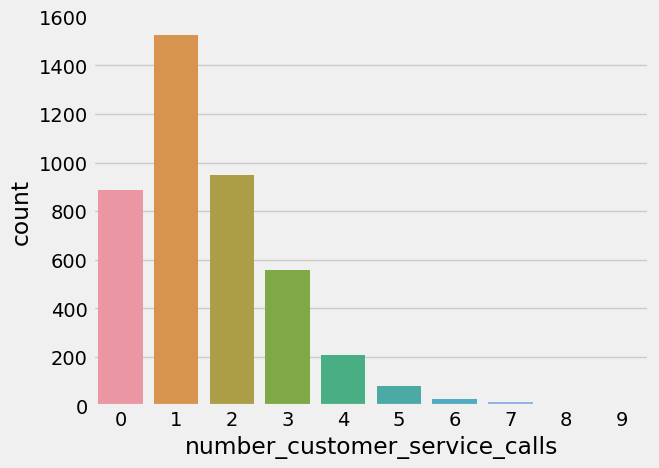

In [ ]:
sns.countplot(x=train['number_customer_service_calls']);

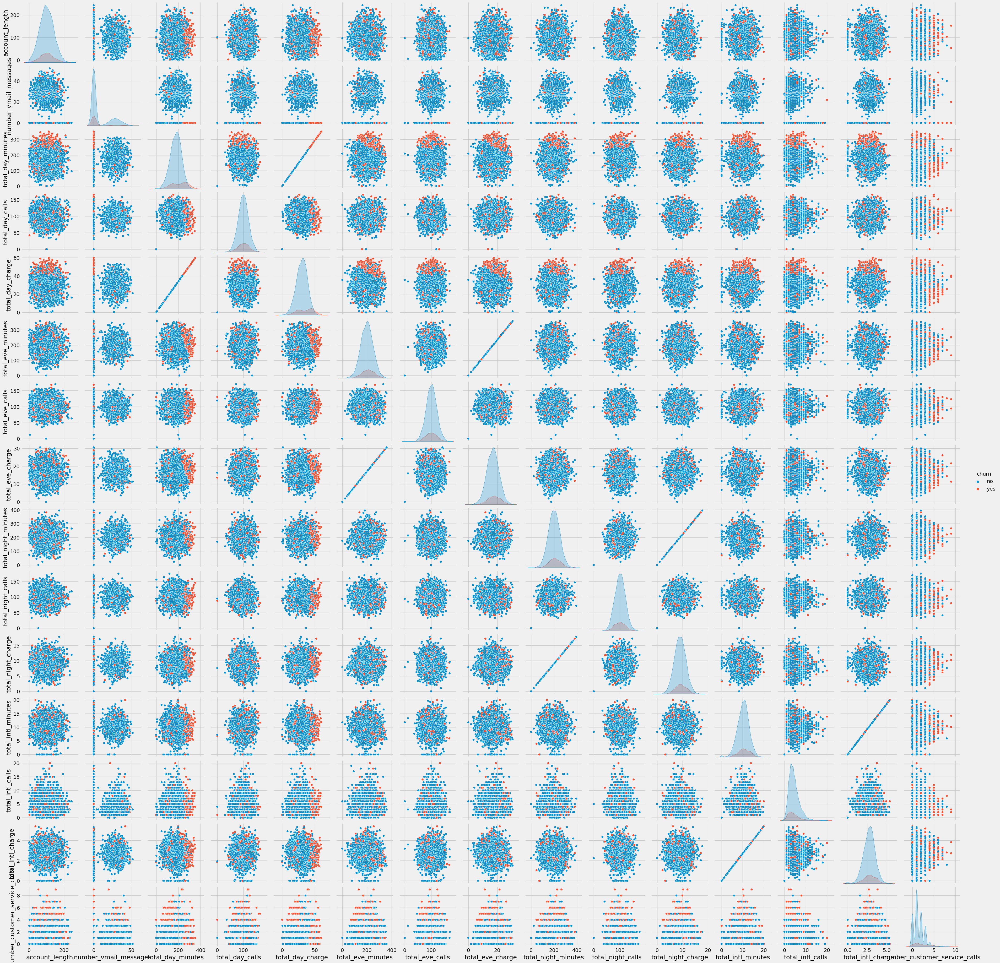

In [ ]:
sns.pairplot(train, hue='churn')

In [ ]:
print(f'Train Dataset Shape : {train.shape}')
print(f'Test Dataset Shape : {test.shape}')

Train Dataset Shape : (4250, 20)
Test Dataset Shape : (750, 20)


# 3. Data Preprocessing

In [ ]:
# Loop over the columns in the DataFrame 
for i in train.columns: 
# Check if there are any missing values in the column 
	if (train[i].isnull().sum() > 0): 
	# Calculate the percentage of missing values 
		misval = (train[i].isnull().sum()) / (len(train[i])) * 100 
		# Print the name of the column and the percentage of missing values 
		print(f'{i} Perc. Mis Val = {misval:.2f} %')

There are no missing values because the output none

In [ ]:
# Initialize lists to store categorical and numerical features 
catfeat = ['state', 'area_code', 'international_plan', 'voice_mail_plan']
# Loop over the columns in the DataFrame 
for i in train.columns: 
    if (train[i].dtype == 'object'):
        print(f'{i} : {train[i].nunique()} labels')

state : 51 labels
area_code : 3 labels
international_plan : 2 labels
voice_mail_plan : 2 labels
churn : 2 labels


There is high cardinality in state features

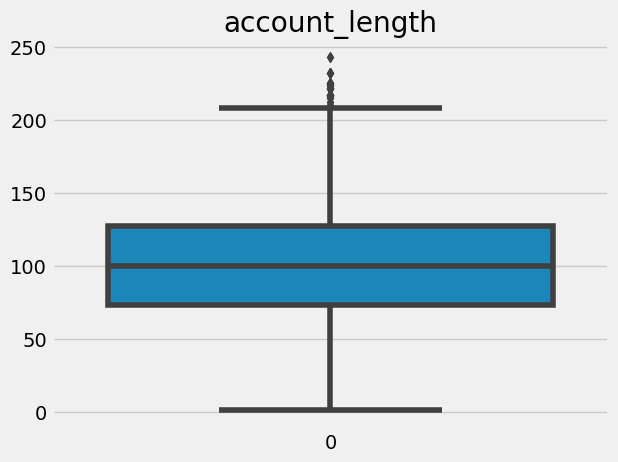

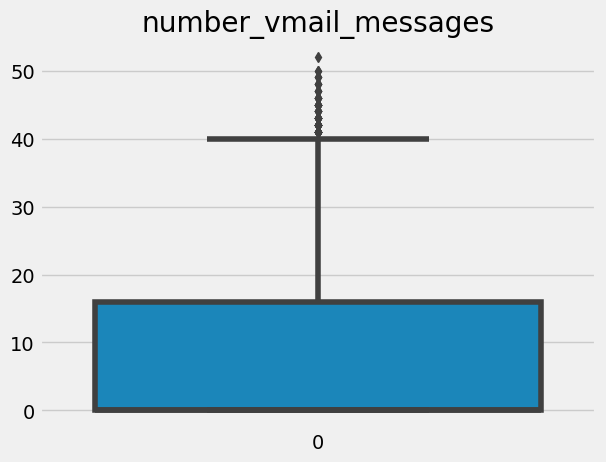

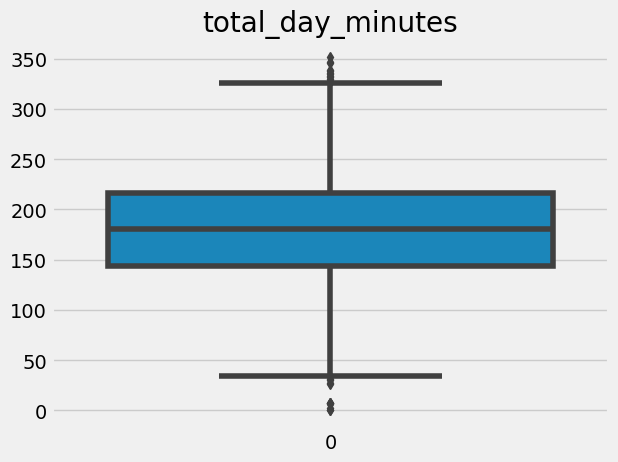

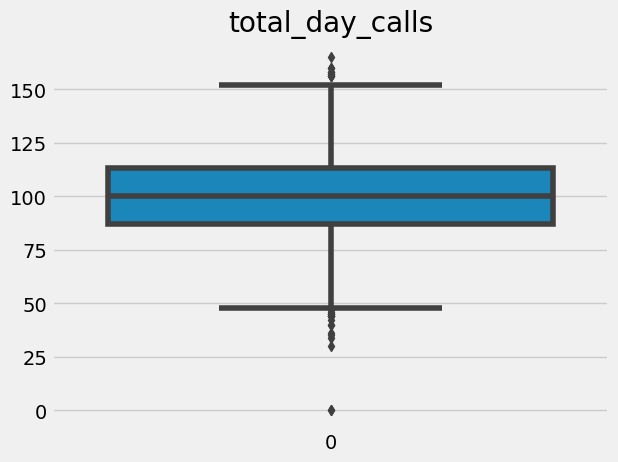

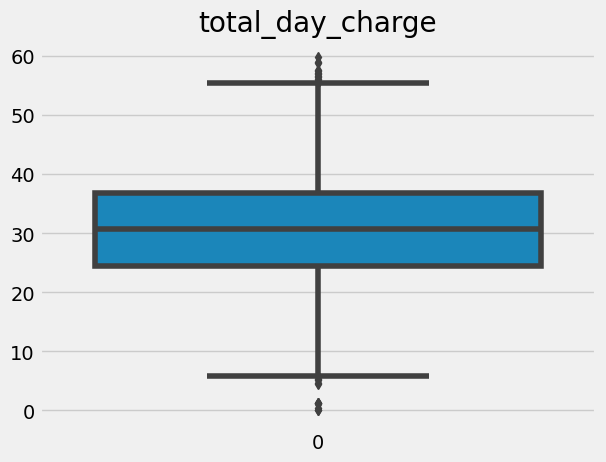

...

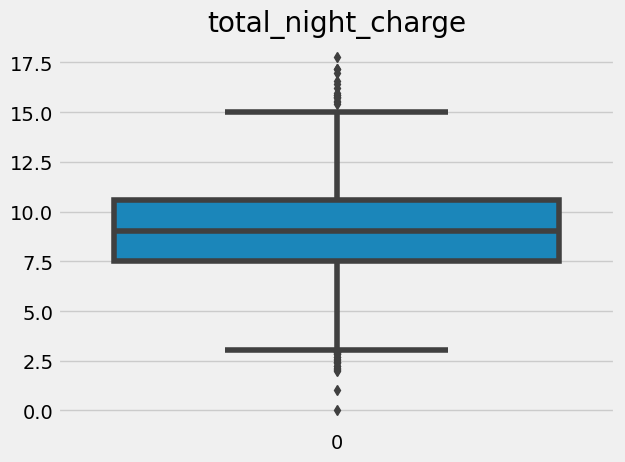

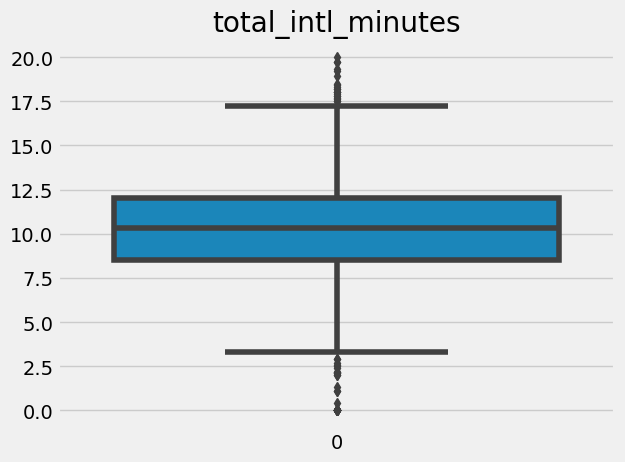

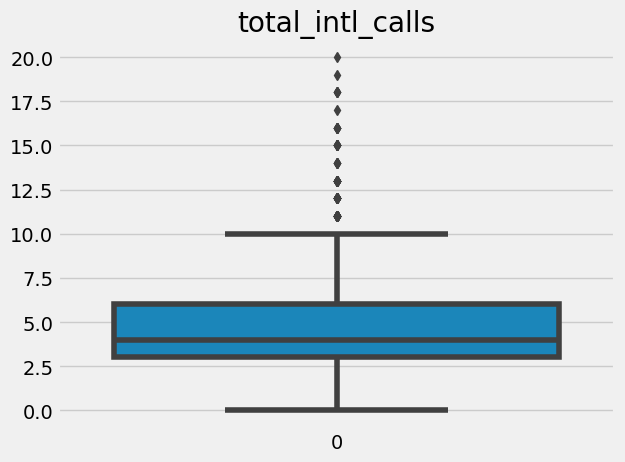

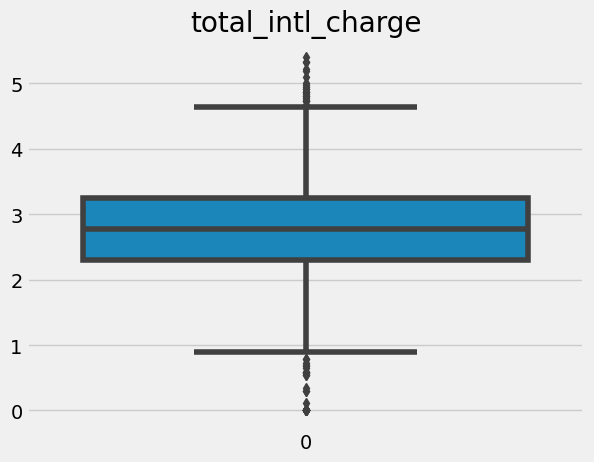

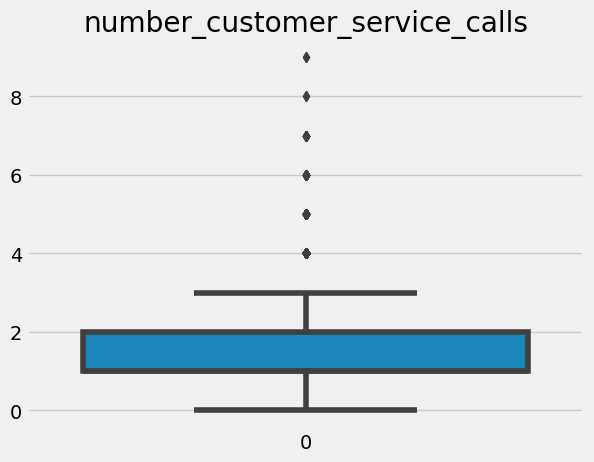

In [ ]:
for i in train.columns:
  # Check if the data type of the column is int64 or float64
  if((train[i].dtype == 'int64') | (train[i].dtype == 'float64')):
    # Set the title of the plot to the name of the column
    plt.title(i)
    # Create a box plot of the column
    sns.boxplot(train[i])
    # Show the plot
    plt.show()

In [ ]:
#train = train.drop('id', axis = 1)
train = train.drop('state', axis = 1)

In [ ]:
for i in train.columns:
  # Check if the data type of the column is int64 or float64
  if((train[i].dtype == 'int64') | (train[i].dtype == 'float64')):
        q25 = percentile(train[i], 25) 
        q75 = percentile(train[i], 75)
        iqr = q75 - q25
        cutoff = 1.5 * iqr
        lower = q25 - cutoff
        upper = q75 + cutoff
        print(i)
        print(f'The Lower Limit is : {lower}, The Upper Limit is : {upper}')
        print('The Number of Above Upper Limits :' ,len(train[train[i] > upper]))
        print('The Number of Below Lower Limits :' ,len(train[train[i] < lower]))

account_length
The Lower Limit is : -8.0, The Upper Limit is : 208.0
The Number of Above Upper Limits : 20
The Number of Below Lower Limits : 0
number_vmail_messages
The Lower Limit is : -24.0, The Upper Limit is : 40.0
The Number of Above Upper Limits : 86
The Number of Below Lower Limits : 0
total_day_minutes
The Lower Limit is : 34.01250000000006, The Upper Limit is : 325.51249999999993
The Number of Above Upper Limits : 13
The Number of Below Lower Limits : 12
total_day_calls
The Lower Limit is : 48.0, The Upper Limit is : 152.0
The Number of Above Upper Limits : 10
The Number of Below Lower Limits : 18
total_day_charge
The Lower Limit is : 5.787499999999998, The Upper Limit is : 55.3275
The Number of Above Upper Limits : 14
The Number of Below Lower Limits : 12
total_eve_minutes
The Lower Limit is : 64.15000000000002, The Upper Limit is : 335.55
The Number of Above Upper Limits : 15
The Number of Below Lower Limits : 19
total_eve_calls
The Lower Limit is : 46.5, The Upper Limit is

- Using IQR The only significant amount of outliers appears on number customer service calls
- We will replace the outliers in customer service calls with median

In [ ]:
cs_median = np.median(train['number_customer_service_calls'])
train['number_customer_service_calls'] = np.where(
    train['number_customer_service_calls'] > upper, cs_median, 
    train['number_customer_service_calls'])

train['number_customer_service_calls'] = np.where(
    train['number_customer_service_calls'] < lower, cs_median, 
    train['number_customer_service_calls'])

## Feature Encoding

In [ ]:
le = LabelEncoder() 
for i in train.columns : 
    if(train[i].dtype == 'object') and (len(train[i].value_counts()) == 2):
        train[i] = le.fit_transform(train[i])
train = pd.get_dummies(train)
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   account_length                 4250 non-null   int64  
 1   international_plan             4250 non-null   int64  
 2   voice_mail_plan                4250 non-null   int64  
 3   number_vmail_messages          4250 non-null   int64  
 4   total_day_minutes              4250 non-null   float64
 5   total_day_calls                4250 non-null   int64  
 6   total_day_charge               4250 non-null   float64
 7   total_eve_minutes              4250 non-null   float64
 8   total_eve_calls                4250 non-null   int64  
 9   total_eve_charge               4250 non-null   float64
 10  total_night_minutes            4250 non-null   float64
 11  total_night_calls              4250 non-null   int64  
 12  total_night_charge             4250 non-null   f

## Splitting into X & y Features

In [ ]:
X, y  = train.drop('churn', axis=1), train['churn']
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size = 0.2, random_state = 42, stratify = y)

## Class Balancing Operations 

In [ ]:
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)
X_val, y_val = smote.fit_resample(X_val, y_val)

## 2. Model Training 
- To follow the rules, we will add 3 more models for comparison :
    1. XGBClassifier
    2. LGBMClassifier    
    3. Bagging Classifier
    4. RandomForestClassifier
    5. AdaBoostClassifier
    6. SVC
    7. DecisionTreeClassifier
- 3 Models that we found performed best will be used for hyperparameter tuning

In [ ]:
# train all model 
xgb = xgb.XGBClassifier(random_state = 42).fit(X_train, y_train)
lgb = lgb.LGBMClassifier(random_state=42).fit(X_train, y_train)
bagging = BaggingClassifier(random_state=42).fit(X_train, y_train)
rf = RandomForestClassifier(random_state=42).fit(X_train, y_train)
ada = AdaBoostClassifier(random_state=42).fit(X_train, y_train)
svm = SVC(random_state=42).fit(X_train, y_train )

In [ ]:
models = [svm, rf, ada, bagging, lgb, xgb]
cv = StratifiedKFold(n_splits = 5, random_state=42, shuffle=True)

for model in models:
    crosval = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'recall')
    print(f'Model Name {model}')
    print(f'Recall Score : {mean(crosval)}')

Model Name SVC(random_state=42)
Recall Score : 0.503078679311556
Model Name RandomForestClassifier(random_state=42)
Recall Score : 0.9151235218358507
Model Name AdaBoostClassifier(random_state=42)
Recall Score : 0.8343460953049995
Model Name BaggingClassifier(random_state=42)
Recall Score : 0.9110168598524764
Model Name LGBMClassifier(random_state=42)
Recall Score : 0.9332613277133825
Model Name XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan,

3 Best Performer Model Based on Recall Were : 
1. XGBClassifier
2. LGBMClassifier
3. RandomForestClassifier

## 3. Hyperparameter Optimization

In [ ]:
import xgboost as xgb
# hyperparameter for xgboost
# Define objective function for Optuna
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, step=0.01),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0, step=0.1),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0, step=0.1),
        'gamma': trial.suggest_float('gamma', 0.1, 1.0, step=0.1),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.1, 10.0, step=0.1),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 10.0, step=0.1),
        'random_state': 0,
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
    }
    
    # Train XGBoost model with early stopping
    model = xgb.XGBClassifier(**params)
    eval_set = [(X_val, y_val)]
    model.fit(X_train, y_train, eval_set=eval_set, early_stopping_rounds=50, verbose=False)
    
    # Predict on validation set
    y_pred = model.predict(X_val)
    
    # Evaluate on test set and return AUC score
    recall = recall_score(y_val, y_pred)
    return recall

# Define study and optimize hyperparameters with Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Print best hyperparameters and score
print('Best hyperparameters: ', study.best_params)
print('Best score: ', study.best_value)

# Results 
# Best hyperparameters:  {'n_estimators': 700, 'max_depth': 7, 'learning_rate': 0.04, 'colsample_bytree': 0.9, 'subsample': 1.0, 'gamma': 0.1, 'reg_alpha': 9.8, 'reg_lambda': 9.2}
# Best score:  0.902739726027397

[I 2023-04-01 09:22:58,428] A new study created in memory with name: no-name-0980fa89-aaf3-4bed-bb13-171f016471f4
[I 2023-04-01 09:22:58,812] Trial 0 finished with value: 0.8315068493150685 and parameters: {'n_estimators': 600, 'max_depth': 9, 'learning_rate': 0.060000000000000005, 'colsample_bytree': 0.1, 'subsample': 0.6, 'gamma': 1.0, 'reg_alpha': 9.1, 'reg_lambda': 8.4}. Best is trial 0 with value: 0.8315068493150685.
[I 2023-04-01 09:23:00,759] Trial 1 finished with value: 0.8726027397260274 and parameters: {'n_estimators': 550, 'max_depth': 5, 'learning_rate': 0.05, 'colsample_bytree': 0.6, 'subsample': 0.2, 'gamma': 0.4, 'reg_alpha': 0.8, 'reg_lambda': 2.4000000000000004}. Best is trial 1 with value: 0.8726027397260274.
[I 2023-04-01 09:23:03,938] Trial 2 finished with value: 0.8835616438356164 and parameters: {'n_estimators': 100, 'max_depth': 8, 'learning_rate': 0.2, 'colsample_bytree': 0.6, 'subsample': 0.6, 'gamma': 0.7000000000000001, 'reg_alpha': 3.1, 'reg_lambda': 4.7}. B

Best hyperparameters:  {'n_estimators': 1000, 'max_depth': 3, 'learning_rate': 0.18000000000000002, 'colsample_bytree': 0.6, 'subsample': 0.8, 'gamma': 0.4, 'reg_alpha': 4.5, 'reg_lambda': 7.4}
Best score:  0.9041095890410958


In [ ]:
import lightgbm as lgb
# hyperparameter optimization for lgbm 
# Define objective function for Optuna
def objective(trial):
    params = {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, step=0.01),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0, step=0.1),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0, step=0.1),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.1, 10.0, step=0.1),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 10.0, step=0.1),
        'num_leaves': trial.suggest_int('num_leaves', 10, 300),
        'random_state': 0,
    }
    
    # Train LightGBM model
    model = lgb.LGBMClassifier(**params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=50, verbose=False)
    
    # Predict on validation set
    y_pred = model.predict(X_val)
    
    # Evaluate on test set and return AUC score
    recall = recall_score(y_val, y_pred)
    return recall

# Define study and optimize hyperparameters with Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Print best hyperparameters and score
print('Best hyperparameters: ', study.best_params)
print('Best score: ', study.best_value)

# Best hyperparameters:  {'n_estimators': 750, 'max_depth': 9, 'learning_rate': 0.15000000000000002, 'colsample_bytree': 1.0, 'subsample': 0.2, 'reg_alpha': 8.2, 'reg_lambda': 7.3, 'num_leaves': 214}
# Best score:  0.9027397260273973

[I 2023-04-01 09:33:26,220] A new study created in memory with name: no-name-d631e312-32c7-4201-8e25-1946632257ae
[I 2023-04-01 09:33:27,318] Trial 0 finished with value: 0.8123287671232877 and parameters: {'n_estimators': 850, 'max_depth': 8, 'learning_rate': 0.03, 'colsample_bytree': 0.1, 'subsample': 1.0, 'reg_alpha': 5.6, 'reg_lambda': 2.6, 'num_leaves': 228}. Best is trial 0 with value: 0.8123287671232877.
[I 2023-04-01 09:33:27,602] Trial 1 finished with value: 0.8917808219178082 and parameters: {'n_estimators': 700, 'max_depth': 4, 'learning_rate': 0.15000000000000002, 'colsample_bytree': 0.8, 'subsample': 0.8, 'reg_alpha': 4.9, 'reg_lambda': 3.2, 'num_leaves': 273}. Best is trial 1 with value: 0.8917808219178082.
[I 2023-04-01 09:33:27,801] Trial 2 finished with value: 0.8808219178082192 and parameters: {'n_estimators': 600, 'max_depth': 3, 'learning_rate': 0.25, 'colsample_bytree': 0.4, 'subsample': 1.0, 'reg_alpha': 7.6, 'reg_lambda': 6.5, 'num_leaves': 20}. Best is trial 1 w

Best hyperparameters:  {'n_estimators': 600, 'max_depth': 4, 'learning_rate': 0.27, 'colsample_bytree': 1.0, 'subsample': 1.0, 'reg_alpha': 4.7, 'reg_lambda': 1.5000000000000002, 'num_leaves': 260}
Best score:  0.9


In [ ]:
# hyperparameter optimization for random forest classifier 

# Define objective function for Optuna
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
        'random_state': 0,
    }
    
    # Train Random Forest model
    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    
    # Evaluate on test set and return accuracy score
    recall = recall_score(y_val, y_pred)
    return recall

# Define study and optimize hyperparameters with Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Print best hyperparameters and score
print('Best hyperparameters: ', study.best_params)
print('Best score: ', study.best_value)

# Best hyperparameters:  {'n_estimators': 50, 'max_depth': 10, 'min_samples_split': 16, 'min_samples_leaf': 7, 'max_features': 'log2'}
# Best score:  0.8410958904109589

[I 2023-04-01 09:36:00,571] A new study created in memory with name: no-name-f112e6ea-56ac-4c6b-be28-55f39ea866c9
[I 2023-04-01 09:36:21,064] Trial 0 finished with value: 0.8136986301369863 and parameters: {'n_estimators': 550, 'max_depth': 8, 'min_samples_split': 11, 'min_samples_leaf': 19, 'max_features': None}. Best is trial 0 with value: 0.8136986301369863.
[I 2023-04-01 09:36:57,793] Trial 1 finished with value: 0.8315068493150685 and parameters: {'n_estimators': 800, 'max_depth': 10, 'min_samples_split': 19, 'min_samples_leaf': 17, 'max_features': None}. Best is trial 1 with value: 0.8315068493150685.
[I 2023-04-01 09:36:59,817] Trial 2 finished with value: 0.7986301369863014 and parameters: {'n_estimators': 50, 'max_depth': 9, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.8315068493150685.
[I 2023-04-01 09:37:10,547] Trial 3 finished with value: 0.8164383561643835 and parameters: {'n_estimators': 300, 'max_depth': 7, 'min_sa

Best hyperparameters:  {'n_estimators': 550, 'max_depth': 3, 'min_samples_split': 9, 'min_samples_leaf': 10, 'max_features': None}
Best score:  0.8547945205479452


In [ ]:
# build new model with best parameter 

xgb = xgb.XGBClassifier(n_estimators = 700, max_depth = 7, learning_rate = 0.04, 
                       colsample_bytree = 0.9, subsample = 1.0, gamma = 0.1, reg_alpha = 9.8, 
                        reg_lambda = 9.2, random_state = 0).fit(X_train, y_train)
lgb = lgb.LGBMClassifier(n_estimators = 750, max_depth = 9, learning_rate = 0.15000000000000002, 
                         colsample_bytree = 1.0, subsample = 0.2, reg_alpha = 8.2, reg_lambda = 7.3, 
                         num_leaves = 214, random_state = 0).fit(X_train, y_train)
rf = RandomForestClassifier(n_estimators = 50, max_depth = 10, min_samples_split = 16, 
                            min_samples_leaf = 7, max_features = 'log2', random_state=0).fit(X_train, y_train)

# 4. Model Evaluation 

#### Evaluation using Classification Report 

In [ ]:
models = [rf, lgb, xgb]
for model in models:
    y_pred = model.predict(X_val)
    print(model)
    print(classification_report(y_val, y_pred))

RandomForestClassifier(max_depth=10, max_features='log2', min_samples_leaf=7,
                       min_samples_split=16, n_estimators=50, random_state=0)
              precision    recall  f1-score   support

           0       0.86      0.97      0.91       730
           1       0.97      0.84      0.90       730

    accuracy                           0.91      1460
   macro avg       0.91      0.91      0.91      1460
weighted avg       0.91      0.91      0.91      1460

LGBMClassifier(learning_rate=0.15000000000000002, max_depth=9, n_estimators=750,
               num_leaves=214, random_state=0, reg_alpha=8.2, reg_lambda=7.3,
               subsample=0.2)
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       730
           1       0.97      0.90      0.93       730

    accuracy                           0.93      1460
   macro avg       0.94      0.93      0.93      1460
weighted avg       0.94      0.93      0.93      1460

X

#### Evaluation Using Confusion Matrix

RandomForestClassifier(max_depth=10, max_features='log2', min_samples_leaf=7,
                       min_samples_split=16, n_estimators=50, random_state=0)


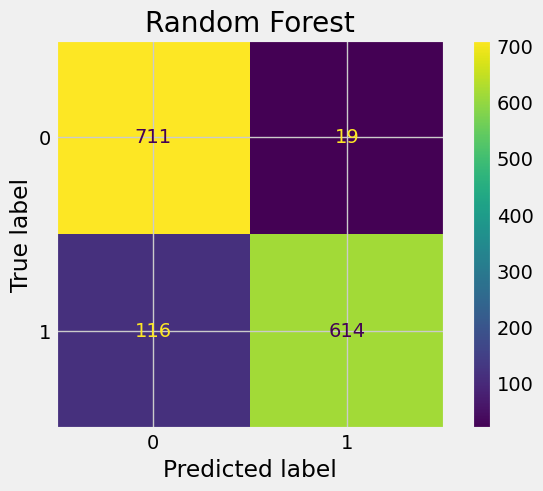

LGBMClassifier(learning_rate=0.15000000000000002, max_depth=9, n_estimators=750,
               num_leaves=214, random_state=0, reg_alpha=8.2, reg_lambda=7.3,
               subsample=0.2)


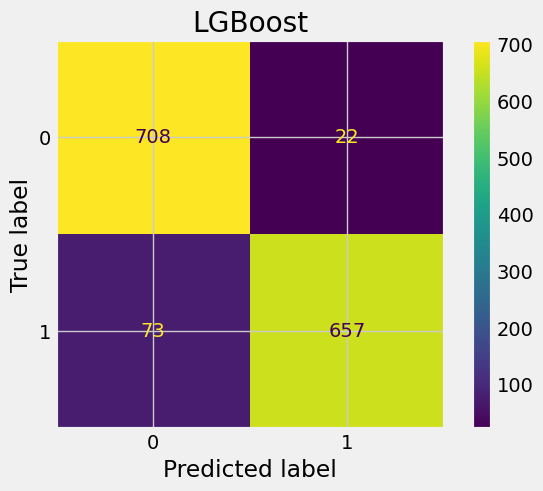

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.04, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=700, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=0, ...)


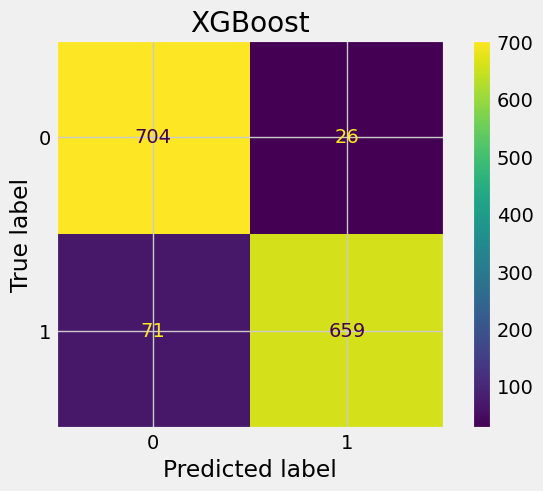

In [ ]:
names = ['dummy', 'Random Forest', 'LGBoost', 'XGBoost']
i = 0
models = [rf, lgb, xgb]
for i, model in enumerate(models):
    y_pred = model.predict(X_val)
    print(model)
    cm = confusion_matrix(y_val, y_pred)
    cm_display = ConfusionMatrixDisplay(cm)
    
    cm_display.plot()
    plt.title(names[i+1])
    plt.savefig(f'{names[i+1]}.png', dpi=300, bbox_inches='tight')
    plt.show()

#### Evaluation Using ROC Curve

In [ ]:
def roc_comparison(model, name):
    y_pred = model.predict(X_val)
    y_probs = model.predict_proba(X_val)
    y_probs = y_probs[:, 1]

    fpr, tpr, _ = roc_curve(y_val, y_probs)
    auc = round(roc_auc_score(y_val, y_probs), 4)
    plt.plot(fpr, tpr, label = (f'{name} (AUC = {auc:.4f})'))
    plt.legend(loc='best')

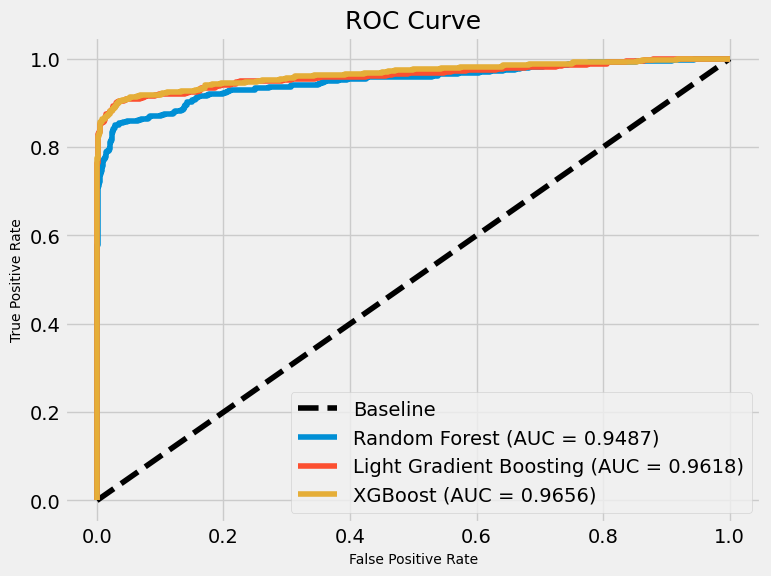

In [ ]:
# create a plot 
ax, fig = plt.subplots(figsize=(8,6)) 

# create a baseline 
plt.plot([0,1], [0,1], linestyle='--', label='Baseline', color = 'black') 

roc_comparison(rf, 'Random Forest')
roc_comparison(lgb, 'Light Gradient Boosting')
roc_comparison(xgb, 'XGBoost')

# set plot axises 
plt.ylabel('True Positive Rate', size = 10) 
plt.xlabel('False Positive Rate', size = 10) 
plt.title('ROC Curve', size=18) 
plt.legend() 

# show the plot 
plt.savefig('ROC Curve.png', dpi=300, bbox_inches='tight')
plt.show()

The best performer model was : 

# 5. Submission
To Maintain Consistency, we will use the same data preprocessing that we performed in train dataset 

In [ ]:
test = test.drop(['state', 'id'], axis=1)

In [ ]:
for i in test.columns:
  # Check if the data type of the column is int64 or float64
  if((test[i].dtype == 'int64') | (test[i].dtype == 'float64')):
        q25 = percentile(test[i], 25) 
        q75 = percentile(test[i], 75)
        iqr = q75 - q25
        cutoff = 1.5 * iqr
        lower = q25 - cutoff
        upper = q75 + cutoff
        print(f'Variable Names : {i}')
        print(f'The Lower Limit is : {lower}, The Upper Limit is : {upper}')
        print('The Number of Above Upper Limits :' ,len(test[test[i] > upper]))
        print('The Number of Below Lower Limits :' ,len(test[test[i] < lower]))

Variable Names : account_length
The Lower Limit is : -4.0, The Upper Limit is : 204.0
The Number of Above Upper Limits : 6
The Number of Below Lower Limits : 0
Variable Names : number_vmail_messages
The Lower Limit is : -31.5, The Upper Limit is : 52.5
The Number of Above Upper Limits : 0
The Number of Below Lower Limits : 0
Variable Names : total_day_minutes
The Lower Limit is : 42.60000000000001, The Upper Limit is : 320.0
The Number of Above Upper Limits : 3
The Number of Below Lower Limits : 6
Variable Names : total_day_calls
The Lower Limit is : 49.0, The Upper Limit is : 153.0
The Number of Above Upper Limits : 2
The Number of Below Lower Limits : 5
Variable Names : total_day_charge
The Lower Limit is : 7.239999999999998, The Upper Limit is : 54.400000000000006
The Number of Above Upper Limits : 3
The Number of Below Lower Limits : 6
Variable Names : total_eve_minutes
The Lower Limit is : 63.037499999999966, The Upper Limit is : 339.7375
The Number of Above Upper Limits : 6
The N

In [ ]:
cs_median = np.median(test['number_customer_service_calls'])
test['number_customer_service_calls'] = np.where(
    test['number_customer_service_calls'] > upper, cs_median, 
    test['number_customer_service_calls'])

test['number_customer_service_calls'] = np.where(
    test['number_customer_service_calls'] < lower, cs_median, 
    test['number_customer_service_calls'])

In [ ]:
le = LabelEncoder() 
for i in test.columns : 
    if(test[i].dtype == 'object') and (len(test[i].value_counts()) == 2):
        test[i] = le.fit_transform(test[i])
test = pd.get_dummies(test)

In [ ]:
y_pred = xgb.predict(test)
test['churn'] = y_pred

In [ ]:
test.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,...,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,area_code_area_code_408,area_code_area_code_415,area_code_area_code_510,churn
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,...,91,11.01,10.0,3,2.70,1.0,0,1,0,0
1,118,1,0,0,223.4,98,37.98,220.6,101,18.75,...,118,9.18,6.3,6,1.70,0.0,0,0,1,0
2,62,0,0,0,120.7,70,20.52,307.2,76,26.11,...,99,9.14,13.1,6,3.54,1.0,0,1,0,0
3,93,0,0,0,190.7,114,32.42,218.2,111,18.55,...,121,5.83,8.1,3,2.19,3.0,0,0,1,0
4,174,0,0,0,124.3,76,21.13,277.1,112,23.55,...,115,11.28,15.5,5,4.19,3.0,0,1,0,0
